In [64]:
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')
import seaborn as sns
sns.set_context("paper")
sns.set_style("ticks")

import jax
import jax.numpy as jnp
from jax import lax, vmap
from jax.scipy.stats import multivariate_normal
import jax.random as jrandom

import numpy as np

jax.config.update("jax_enable_x64", True)
key = jrandom.PRNGKey(123)

# Metropolis-Hastings with Blackjax

Let's use the Metropolis-Hastings algorithm to sample from a "banana"-shaped distribution (defined in section 5.1.3 of [Wang et. al.](https://arxiv.org/pdf/1706.01435)).

Here is the probability density of the banana distribution:

In [65]:
def banana_logdensity(x, a=1.15, b=0.5, rho=0.5):
    """A banana-shaped distribution. Comes from a nonlinear transformation of a correlated Gaussian."""
    x1, x2 = x
    u1 = x1/a
    u2 = a*(x2 - b*(u1**2 + a**2))
    return multivariate_normal.logpdf(jnp.array([u1, u2]), jnp.zeros(2), jnp.array([[1, rho], [rho, 1]]))

def plot_2d_function(f, alpha=1.0, plot_type="pcolormesh", ax=None, levels=None):
    x = jnp.linspace(-4, 4, 100)
    y = jnp.linspace(-2, 7, 100)
    X, Y = jnp.meshgrid(x, y)
    Z = vmap(f)(jnp.stack([X.flatten(), Y.flatten()], axis=1)).reshape(X.shape)

    if ax is None:
        _, ax = plt.subplots()
    if plot_type == "contour":
        ax.contour(X, Y, jnp.exp(Z), alpha=alpha, cmap="Greens", levels=levels)
    elif plot_type == "pcolormesh":
        ax.pcolormesh(X, Y, jnp.exp(Z), alpha=alpha)
    ax.set_xticks([-2, 0, 2])
    ax.set_yticks([0, 2, 4])
    ax.set_aspect("equal")
    sns.despine(trim=True, left=True, bottom=True)
    return ax

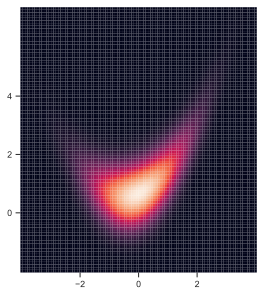

In [66]:
plot_2d_function(banana_logdensity);

## Metropolis-Hastings recap

Here is how to set up a Metropolis-Hastings sampler in BlackJax:

In [67]:
import blackjax

# Pick a proposal distribution
def proposal_generator(key, x, sigma=1.0):
    """A Gaussian random walk proposal."""
    return x + sigma*jrandom.normal(key, shape=(2,))

# Create a Rosenbluth-Metropolis-Hastings sampler
rmh = blackjax.rmh(logdensity_fn=banana_logdensity, proposal_generator=proposal_generator)

And here is how the sampling goes. First, start at some point in the parameter space:

In [68]:
def plot_mcmc_samples_demo(samples):#, is_accepted, proposals):
    def plot_next_sample(x0, y0, x1, y1, color, alpha):
        ax.annotate('',
            xytext=(x0, y0),
            xy=(x1, y1),
            arrowprops=dict(arrowstyle="->", color=color, alpha=alpha),
            size=12,
        )
    def plot_point(x, y, color):
        ax.plot(x, y, 'o', color=color, ms=4, zorder=10)

    ax = plot_2d_function(banana_logdensity, alpha=0.4)
    alphas = np.linspace(0.1, 1, samples.shape[0])
    x1, y1 = None, None
    for i in range(samples.shape[0]):
        x1, y1 = samples[i]
        if i > 0:
            x0, y0 = samples[i-1]
            if (x0, y0) != (x1, y1):
                plot_next_sample(x0, y0, x1, y1, "black", alphas[i])
        plot_point(x1, y1, "tab:blue")
    # c = "green" if is_accepted[-1] else "red"
    # plot_next_sample(x1, y1, proposals[-1, 0], proposals[-1, 1], c, 1.0)
    # plot_point(proposals[-1, 0], proposals[-1, 1], c)
    proposal_logdensity = lambda x: multivariate_normal.pdf(x, jnp.array([x1, y1]), jnp.eye(2))
    ax = plot_2d_function(proposal_logdensity, alpha=0.4, plot_type="contour", ax=ax, levels=5)

In [69]:
# Initialize the sampler state
init_state = rmh.init(jnp.array([0.0, 0.0]))

plot_mcmc_samples_demo(init_state.position.reshape(1, -1))

The green lines are the contours of the proposal distribution.
The next step is to propose a new point by sampling this proposal distribution.
This proposed point is either accepted or rejected.
And then we repeat. Over and over.
Let's run the chain for a few steps:

In [70]:
state = init_state
prelim_samples = [init_state.position]
for i in range(10):
    key, subkey = jrandom.split(key)
    state, info = rmh.step(subkey, state)
    prelim_samples.append(state.position)
prelim_samples = jnp.stack(prelim_samples)

plot_mcmc_samples_demo(prelim_samples)

Let's do it for real now. 
We'll run 5 MCMC chains, each with 400 steps:

In [71]:
def step(state, _):
    """A single step of the Metropolis-Hastings sampler. Used with `lax.scan`."""
    key, kernel_state = state
    key, subkey = jrandom.split(key)
    kernel_state, info = rmh.step(subkey, kernel_state)
    return (key, kernel_state), (kernel_state.position, info)

def run_mcmc_chain(key, init_state, num_samples):
    """Run a chain of MCMC."""
    _, (samples, info) = lax.scan(step, (key, init_state), None, length=num_samples)
    return samples, info

num_chains = 5
num_samples_per_chain = 400

key, key_run, key_init = jrandom.split(key, 3)
keys = jrandom.split(key_run, num_chains)
init_state_spread = 5.0
init_state = vmap(rmh.init)(init_state_spread*jrandom.normal(key_init, (num_chains, 2)))
samples, info = vmap(run_mcmc_chain, in_axes=(0, 0, None))(keys, init_state, num_samples_per_chain)

Let's make the trace plot (with the help of the [`arviz`](https://python.arviz.org/en/stable/) library):

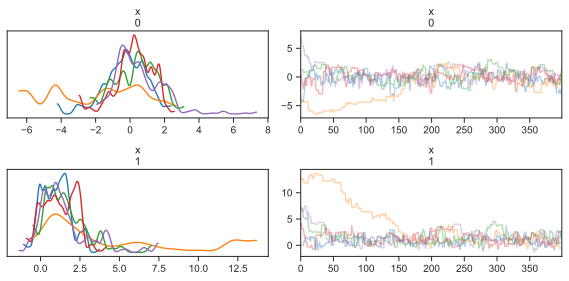

In [72]:
import arviz as az
az.plot_trace(np.array(samples[:, :]), compact=False, backend_kwargs=dict(figsize=(8,4), tight_layout=True));

## Assessing convergence

In general, it takes some time for the chains to converge to the target distribution. 
The samples gathered while the chain has not yet converged are called "warm-up" or "burn-in" samples.

**But how many burn-in samples do we need before the chain has converged?** One common diagnostic to help answer this question is the split-$\hat{R}$.
It is defined as 

$$
\hat{R} = \sqrt{\frac{\hat{V}}{W}}
$$

where $W$ is the within-chain variance and $\hat{V}$ an estimate of the variance between chains.
If the chains have converged, $\hat{R}$ should be close to 1.

Let's see how $\hat{R}$ evolves as we take more and more MCMC steps:

In [73]:
compute_diagnostics_every = 10
rhats = []
for i in range(2, num_samples_per_chain, compute_diagnostics_every):
    rhat = blackjax.diagnostics.potential_scale_reduction(samples[:, :i])
    rhats.append(rhat)
rhats = jnp.array(rhats)

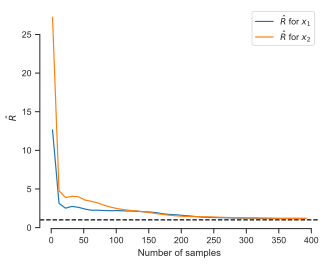

In [74]:
fig, ax = plt.subplots(figsize=(5,4))
ax.plot(range(2, num_samples_per_chain, compute_diagnostics_every), rhats[:,0], label=r"$\hat{R}$ for $x_1$")
ax.plot(range(2, num_samples_per_chain, compute_diagnostics_every), rhats[:,1], label=r"$\hat{R}$ for $x_2$")
ax.axhline(1.0, color="black", linestyle="--")
ax.set_xlabel("Number of samples")
ax.set_ylabel(r"$\hat{R}$")
ax.legend()
sns.despine(trim=True)

This plot suggests that the chains are not converged in the first 100 samples.
These are burn-in samples and should be discarded.

## Dealing with correlated samples

Another issue with our samples is that they are correlated. 
Meaning that the $(i+1)^\text{th}$, $(i+2)^\text{th}$, $\dots$ samples are *not* independent from $i^\text{th}$ sample.
If we want approximately independent samples, we need to throw away most samples and only keep every $n$-th sample.
This is called *thinning*.

**But how many samples should we thin out?** The effective sample size (ESS) helps answer this question.
Let's plot ESS as the number of samples increases:

In [75]:
n_effs = []
for i in range(2, num_samples_per_chain, compute_diagnostics_every):
    n_eff = blackjax.diagnostics.effective_sample_size(samples[:, :i])
    n_effs.append(n_eff)
n_effs = jnp.array(n_effs)

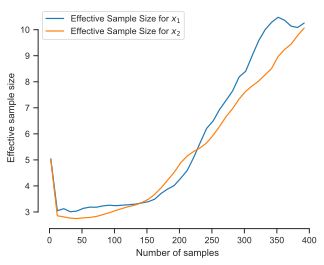

In [76]:
fig, ax = plt.subplots(figsize=(5,4))
ax.plot(range(2, num_samples_per_chain, compute_diagnostics_every), n_effs[:,0], label=f"Effective Sample Size for $x_1$")
ax.plot(range(2, num_samples_per_chain, compute_diagnostics_every), n_effs[:,1], label=f"Effective Sample Size for $x_2$")
ax.set_xlabel("Number of samples")
ax.set_ylabel("Effective sample size")
ax.legend()
sns.despine(trim=True)

After 400 MCMC steps, we can see how many times we've effectively sampled our distribution.
The ESS tells us by how much we should thin our samples.

Now that we've diagnosed our chains, let's plot the "true" samples (i.e., after thinning and removing burn-in):

In [77]:
# The original shape of the `samples` array is (n_chains, n_samples, n_dim)
burn_in = 100  # Remove first N samples
thin = 4  # Only keep every M samples
true_samples = samples[:, burn_in::thin]

# Concatenate the chains. Final shape is (n_chains * n_true_samples_per_chain, n_dim)
true_samples = true_samples.reshape(-1, 2)

In [78]:
x = jnp.linspace(-4, 4, 100)
y = jnp.linspace(-3, 7, 100)
X, Y = jnp.meshgrid(x, y)
Z = vmap(banana_logdensity)(jnp.stack([X.flatten(), Y.flatten()], axis=1)).reshape(X.shape)

ax = plot_2d_function(banana_logdensity, alpha=0.4);
ax.set_title("MCMC samples from \nthe original distribution", fontsize=16)
ax.scatter(true_samples[:, 0], true_samples[:, 1], s=4);

Indeed, these do look like samples from the banana distribution. MCMC was successful!

## Questions

- **Play with the proposal distribution.** Change the `alpha` parameter to make proposal distribution more narrow or wide. How does this affect the evolution of $\hat{R}$ and ESS?
- Try a proposal distribution that is independent of the state $x$. What happens if this proposal distribution does not cover well the region of high probability in the target distribution?
- **Play with the starting point.** Try starting the chains from points that are farther away from the mode of the distribution (e.g., by modifying the `init_state_spread` parameter). How does starting from a "bad" point affect the convergence? How can you tell when you've started at a "bad" point?